In [1]:
from samap.mapping import SAMAP
from samap.analysis import (get_mapping_scores, GenePairFinder,
                            sankey_plot, chord_plot, CellTypeTriangles, 
                            ParalogSubstitutions, FunctionalEnrichment,
                            convert_eggnog_to_homologs, GeneTriangles)
from samalg import SAM
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
import samap
samap.__version__

'1.0.16'

# 1 mapping directory

In [2]:
import pandas as pd
blast_dir = '/staging/leuven/stg_00171/Mark/samap/maps/'
A=pd.read_csv(blast_dir + 'OvPc/Ov_to_Pc.txt',sep='\t',index_col=0,header=None)
B=pd.read_csv(blast_dir + 'OvPc/Pc_to_Ov.txt',sep='\t',index_col=0,header=None)
C=pd.read_csv(blast_dir + 'EsPc/Es_to_Pc.txt',sep='\t',index_col=0,header=None)
D=pd.read_csv(blast_dir + 'EsPc/Pc_to_Es.txt',sep='\t',index_col=0,header=None)
E=pd.read_csv(blast_dir + 'OvEs/Ov_to_Es.txt',sep='\t',index_col=0,header=None)
F=pd.read_csv(blast_dir + 'OvEs/Es_to_Ov.txt',sep='\t',index_col=0,header=None)

In [3]:
A.head()

,1,2,3,4,5,6,7,8,9,10,11
0,,,,,,,,,,,
t.MergePeak_minus_189_g.MergePeak_minus_189,XP_025094496.1,53.261,92,43,0,2,93,296,387,3.120000e-23,93.2
t.MergePeak_minus_189_g.MergePeak_minus_189,XP_025095628.1,68.254,63,17,1,2,61,332,394,1.360000e-22,91.3
t.MergePeak_minus_2429_g.MergePeak_minus_2429,XP_025085142.1,88.591,149,17,0,1,149,1,149,1.030000e-99,284.0
t.MergePeak_minus_2429_g.MergePeak_minus_2429,XP_025096536.1,43.704,135,76,0,5,139,33,167,4.420000e-41,135.0
t.MergePeak_minus_2429_g.MergePeak_minus_2429,XP_025088057.1,41.259,143,84,0,5,147,2,144,1.080000e-40,134.0


In [4]:
B.head()

,1,2,3,4,5,6,7,8,9,10,11
0,,,,,,,,,,,
XP_025075930.1,OctVul6B024861T1.p1_OctVul6B024861,39.062,320,188,4,65,380,42,358,6.150000e-74,234.0
XP_025075931.1,G31463.8_OctVul6B004560,34.831,89,45,2,166,254,1193,1268,8.550000e-12,65.1
XP_025075931.1,GE_FLAMseq_Quantseq~GE_FLAMseq~OctVul6B014269T...,45.763,59,32,0,196,254,68,126,1.640000e-11,63.9
XP_025075931.1,OctVul6B000115T1.p1_OctVul6B000115,47.541,61,32,0,197,257,364,424,2.000000e-11,63.5
XP_025075931.1,G43407.7_OctVul6B003151,38.710,62,38,0,196,257,1159,1220,3.720000e-11,63.2


In [5]:
C.head()

,1,2,3,4,5,6,7,8,9,10,11
0,,,,,,,,,,,
g1.t1,XP_025091904.1,82.828,198,34,0,5,202,7,204,1.700000e-126,354.0
g1.t1,XP_025105742.1,29.670,182,103,5,32,200,42,211,1.290000e-18,80.5
g1.t1,XP_025094677.1,25.490,204,138,4,13,202,13,216,1.730000e-18,79.7
g1.t1,XP_025088228.1,28.108,185,121,2,23,196,30,213,2.440000e-18,79.7
g1.t1,XP_025104457.1,20.879,182,140,3,24,202,24,204,3.390000e-10,57.0


In [6]:
D.head()

,1,2,3,4,5,6,7,8,9,10,11
0,,,,,,,,,,,
XP_025075930.1,g14447.t1,42.517,294,169,0,63,356,37,330,1.680000e-82,256.0
XP_025075931.1,cluster_9102,38.571,70,41,1,184,253,376,443,5.820000e-12,65.5
XP_025075931.1,g12519.t1,33.708,89,46,2,166,254,1058,1133,1.440000e-11,64.7
XP_025075931.1,cluster_6606,41.379,58,34,0,196,253,3,60,2.070000e-11,60.1
XP_025075931.1,g20245.t1,45.902,61,33,0,197,257,137,197,9.670000e-11,61.6


In [7]:
E.head()

,1,2,3,4,5,6,7,8,9,10,11
0,,,,,,,,,,,
t.MergePeak_minus_1043_g.MergePeak_minus_1043,cluster_23936,47.115,104,49,2,1,104,245,342,1.270000e-24,97.4
t.MergePeak_minus_1043_g.MergePeak_minus_1043,g19516.t1,34.821,112,72,1,1,112,15,125,3.580000e-16,71.6
t.MergePeak_minus_1043_g.MergePeak_minus_1043,cluster_24836,30.303,99,69,0,1,99,309,407,1.570000e-10,58.5
t.MergePeak_minus_1069_g.MergePeak_minus_1069,cluster_14156,39.583,96,56,2,15,108,26,121,2.870000e-15,67.0
t.MergePeak_minus_1069_g.MergePeak_minus_1069,cluster_15465,32.727,110,72,2,1,108,35,144,4.160000e-13,63.5


In [8]:
F.head()

,1,2,3,4,5,6,7,8,9,10,11
0,,,,,,,,,,,
g1.t1,OctVul6B029138T1.p1_OctVul6B029138,28.655,171,111,3,32,196,24,189,1.810000e-19,82.0
g1.t1,OctVul6B016791T1.p1_OctVul6B016791,24.299,214,148,3,3,202,6,219,1.990000e-19,82.0
g1.t1,OctVul6B015124T2.p1_OctVul6B015124,27.128,188,123,3,23,197,40,226,6.460000e-18,78.6
g1.t1,G64431.18_OctVul6B006225,23.810,210,130,3,9,201,72,268,6.610000e-15,70.9
g1.t1,OctVul6B017734T1.p1_OctVul6B017734,20.000,195,153,1,11,202,12,206,1.720000e-11,60.5


# 2 add annotation to octopus object

In [ ]:
# octopus

In [26]:
import scanpy as sc
Ov_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/'
Ov = sc.read_h5ad(Ov_dir + 'IX_XII_XV_inner_join_samap.h5ad')

In [27]:
import scanpy as sc
work_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/quality_subset/'
Ov_full = sc.read_h5ad(work_dir + 'IX_XII_XV_top2000_harm.h5ad')

In [33]:
Ov_full.obs_names = Ov_full.obs_names.str.replace('-0', '')
Ov_full.obs_names = Ov_full.obs_names.str.replace('-1', '')
Ov_full.obs_names = Ov_full.obs_names.str.replace('-2', '')

Ov_full.obs_names = Ov_full.obs_names.str.replace('-IX', '-1-IX')
Ov_full.obs_names = Ov_full.obs_names.str.replace('-XII', '-1-XII')
Ov_full.obs_names = Ov_full.obs_names.str.replace('-XV', '-1-XV')

In [34]:
Ov_full.obs_names

Index(['CGGTTTGGTAAGTAAC-1-IX_3', 'GCTTACCTCACCATTT-1-IX_1',
       'CGTTGCAAGCTATTAG-1-IX_1', 'TACGTTAAGGGTCCAC-1-IX_1',
       'CTAACCTGTAGCTGGT-1-IX_1', 'AAGCACCTCCATGTCT-1-IX_3',
       'CTGTTGAAGGATACTT-1-IX_3', 'TACTGTGAGCTAGACC-1-IX_3',
       'GGACATAGTCAAGTGA-1-IX_3', 'CTTATGAGTAACGTGA-1-IX_3',
       ...
       'CGCGTCAAGCGGAGTA-1-XV_2', 'CCCTCAGCAAGTGTGT-1-XV_1',
       'ACGGAACGTCAGGAAC-1-XV_2', 'CCTACCTGTCATGGCC-1-XV_2',
       'GGTATCGCACTTAGGG-1-XV_2', 'TCTGCGAGTAGCAGGT-1-XV_2',
       'GGGGACTAGTTGGCGT-1-XV_1', 'CCTACGGAGGAACCAG-1-XV_2',
       'GGTTTACGTTCCCGAA-1-XV_1', 'CAATCCGGTTCCTCTA-1-XV_2'],
      dtype='object', name='barcode', length=69387)

In [35]:
Ov.obs['coarse_anno'] = Ov_full.obs['coarse_anno']

In [44]:
import scanpy as sc
Ov_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/'
Ov.write_h5ad(Ov_dir + 'IX_XII_XV_inner_join_samap.h5ad')

# 3 prep for SAMap: loading in raw single cell data, basic preprocessing after scrublet including the cell type annotation

In [ ]:
Pc_dir = '/staging/leuven/stg_00171/Mark/Pcan_scRNAseq/scanpy_MAL003_reseq2/'
Pc = Pc_dir + 'adata_Pcan_S9_cb_sc_scr_coarse.h5ad'

Ov_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/'
Ov = Ov_dir + 'IX_XII_XV_inner_join_samap.h5ad'

Es_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis/'
Es = Es_dir + 'Esco_cb_sc_scr_merged_top2000_anno_for_samap.h5ad'

filenames = {'Pc': Pc,'Ov': Ov, 'Es': Es}

In [ ]:
#For example, if we have `hu` and `mo` species and the `hu` BLAST results need to be translated,
# then `names = {'hu' : mapping}, where `mapping = [(Fasta header 1, Gene symbol 1), ... , (Fasta header n, Gene symbol n)]`.

In [24]:
with open("/staging/leuven/stg_00171/Mark/Pcan_genome/Pcan_prot_to_gene_mapping.tsv") as fin, open("/staging/leuven/stg_00171/Mark/Pcan_genome/Pcan_prot_to_gene_mapping.csv", "w") as fout:
    for line in fin:
        fout.write(line.replace("\t", ","))


In [17]:
with open("/staging/leuven/stg_00171/Mark/samap/proteomes/Ovul_prot_to_gene_mapping.tsv") as fin, open("/staging/leuven/stg_00171/Mark/samap/proteomes/Ovul_prot_to_gene_mapping.csv", "w") as fout:
    for line in fin:
        fout.write(line.replace("\t", ","))


# 4 manage mapping tables

In [49]:
import pandas as pd
import re

header_file = "/staging/leuven/stg_00171/Mark/samap/proteomes/Ovul_header.txt"

def extract_id(header):
    h = header.lstrip(">")

    # CASE 1: t.*_g.<ID>  ---> extract after g.
    m = re.search(r"_g\.([A-Za-z0-9\._+-]+)", h)
    if m:
        return m.group(1)

    # CASE 2: anything containing ..._OctVulXXXXX  ---> keep last OctVul ID
    m = re.search(r"(OctVul6B\d+)", h)
    if m:
        return m.group(1)

    # CASE 3: novelGene_xxxxx
    m = re.search(r"(novelGene_\d+)", h)
    if m:
        return m.group(1)
    
    # CASE 4: anything containing ..._OctVul6ncAXXXXXX --> keep last OctVul ID
    m = re.search(r"(OctVul6ncA\d+)", h)
    if m:
        return m.group(1)
    
    # CASE 5: in case of PB.8214T1-00001_PB.8214 --> keep last PB.XXXX
    m = re.search(r"(PB.\d+)", h)
    if m:
        return m.group(1)

    # If no rule matches, return empty
    return ""

# Load file
df = pd.read_csv(header_file, names=["fasta_header"])

# Extract
df["extracted_id"] = df["fasta_header"].apply(extract_id)

df.head()


,fasta_header,extracted_id
0,>t.MergePeak_minus_1025_g.MergePeak_minus_1025,MergePeak_minus_1025
1,>t.MergePeak_minus_1037_g.MergePeak_minus_1037,MergePeak_minus_1037
2,>t.MergePeak_minus_1043_g.MergePeak_minus_1043,MergePeak_minus_1043
3,>t.MergePeak_minus_1069_g.MergePeak_minus_1069,MergePeak_minus_1069
4,>t.MergePeak_minus_1081_g.MergePeak_minus_1081,MergePeak_minus_1081


In [56]:
df[df['extracted_id'] == 'OctVul6B000331']

,fasta_header,extracted_id
2196,>OctVul6B000331T1-00001.p1_OctVul6B000331,OctVul6B000331


In [57]:
df['fasta_header'] = df['fasta_header'].str.replace('>', '')

In [59]:
df.head()

,fasta_header,extracted_id
0,t.MergePeak_minus_1025_g.MergePeak_minus_1025,MergePeak_minus_1025
1,t.MergePeak_minus_1037_g.MergePeak_minus_1037,MergePeak_minus_1037
2,t.MergePeak_minus_1043_g.MergePeak_minus_1043,MergePeak_minus_1043
3,t.MergePeak_minus_1069_g.MergePeak_minus_1069,MergePeak_minus_1069
4,t.MergePeak_minus_1081_g.MergePeak_minus_1081,MergePeak_minus_1081


In [61]:
df.columns = ['protein_id', 'gene_id']

In [62]:
df

,protein_id,gene_id
0,t.MergePeak_minus_1025_g.MergePeak_minus_1025,MergePeak_minus_1025
1,t.MergePeak_minus_1037_g.MergePeak_minus_1037,MergePeak_minus_1037
2,t.MergePeak_minus_1043_g.MergePeak_minus_1043,MergePeak_minus_1043
3,t.MergePeak_minus_1069_g.MergePeak_minus_1069,MergePeak_minus_1069
4,t.MergePeak_minus_1081_g.MergePeak_minus_1081,MergePeak_minus_1081
...,...,...
22799,OctVul6ncA499199T1.p1_OctVul6ncA499199,OctVul6ncA499199
22800,OctVul6ncA500276T1.p1_OctVul6ncA500276,OctVul6ncA500276
22801,OctVul6ncA500290T1.p1_OctVul6ncA500290,OctVul6ncA500290
22802,PB.8214T1-00001_PB.8214,PB.8214


In [63]:
df.to_csv('/staging/leuven/stg_00171/Mark/samap/proteomes/Ovul_prot_to_gene_mapping.tsv', index=0, sep='\t')

In [22]:
Pc_xp_to_LOC = pd.read_csv('/staging/leuven/stg_00171/Mark/Pcan_genome/xp_to_loc.tsv', sep='\t', header=None)
Pc_xp_to_LOC.columns = ['protein_id', 'gene_id']
Pc_xp_to_LOC

,protein_id,gene_id
0,XP_025075930.1,LOC112575009
1,XP_025075931.1,LOC112577448
2,XP_025075932.1,LOC112553123
3,XP_025075933.1,LOC112553124
4,XP_025075934.1,LOC112553125
...,...,...
40373,XP_025116303.1,LOC112577446
40374,XP_025116304.1,LOC112577447
40375,XP_025116305.1,LOC112577449
40376,XP_025116306.1,LOC112577450


In [23]:
Pc_xp_to_LOC.to_csv('/staging/leuven/stg_00171/Mark/Pcan_genome/Pcan_prot_to_gene_mapping.tsv', sep='\t', index=0)

## Euprymna scolopes v3 genome

In [9]:
import pandas as pd

# Load GTF
gtf = pd.read_csv(
    "/staging/leuven/stg_00171/Mark/ESco_Dec2022_mid-embryo_scMO/genome_Esco/Esco_v3/v3_2.2_filtered.gtf",
    sep="\t",
    comment="#",
    header=None,
    names=[
        "chr", "source", "feature", "start", "end",
        "score", "strand", "frame", "attributes"
    ]
)

# Keep transcript rows (recommended)
gtf = gtf[gtf["feature"] == "transcript"]

# Extract IDs
gtf["gene_id"] = gtf["attributes"].str.extract(r'gene_id "([^"]+)"')
gtf["transcript_id"] = gtf["attributes"].str.extract(r'transcript_id "([^"]+)"')

# Create dataframe
mapping_df = gtf[["transcript_id", "gene_id"]].drop_duplicates()

print(mapping_df.head())

   transcript_id gene_id
1          g1.t1      g1
11         g2.t1      g2
17         g3.t1      g3
26         g4.t1      g4
41         g5.t1      g5


In [12]:
mapping_df.columns = ['protein_id', 'gene_id']
mapping_df

,protein_id,gene_id
1,g1.t1,g1
11,g2.t1,g2
17,g3.t1,g3
26,g4.t1,g4
41,g5.t1,g5
...,...,...
245565,cluster_20513.t1,cluster_20513
245569,cluster_18263.t1,cluster_18263
245573,cluster_17984.t1,cluster_17984
245577,cluster_21962.t1,cluster_21962


In [17]:
mapping_df.to_csv("/staging/leuven/stg_00171/Mark/ESco_Dec2022_mid-embryo_scMO/genome_Esco/Esco_v3/prot_to_gene_mapping.tsv", sep='\t', index=0)

## Euprymna scolopes ncbi genome

In [11]:
import pandas as pd

# Load GTF
gtf = pd.read_csv(
    "/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/cellranger_ncbi_genome/GCF_053919585.1_ASM5391958v1_genomic.gtf",
    sep="\t",
    comment="#",
    header=None,
    names=[
        "chr", "source", "feature", "start", "end",
        "score", "strand", "frame", "attributes"
    ]
)

In [14]:
# Keep transcript rows (recommended)
gtf = gtf[gtf["feature"] == "CDS"]

# Extract IDs
gtf["gene_id"] = gtf["attributes"].str.extract(r'gene_id "([^"]+)"')
gtf["protein_id"] = gtf["attributes"].str.extract(r'protein_id "([^"]+)"')

# Create dataframe
mapping_df = gtf[["protein_id", "gene_id"]].drop_duplicates()

print(mapping_df.head())

        protein_id       gene_id
4   XP_079980940.1  LOC145266356
12  XP_079973424.1  LOC145298919
19  XP_079964108.1  LOC145298919
26  XP_079968819.1  LOC145298919
32  XP_079959266.1  LOC145298919


In [16]:
mapping_df.to_csv("/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/cellranger_ncbi_genome/prot_to_gene_mapping.tsv", sep='\t', index=0)

## Drosophila melanogaster

In [12]:
import pandas as pd

gtf = pd.read_csv(
    "/staging/leuven/stg_00171/Mark/Dmel_dataset/GCF_000001215.4_Release_6_plus_ISO1_MT_genomic.gtf",
    sep="\t",
    comment="#",
    header=None,
    names=[
        "chr", "source", "feature", "start", "end",
        "score", "strand", "frame", "attributes"
    ]
)
gtf['attributes'].head()

0    gene_id "Dmel_CR40469"; transcript_id ""; cyt_...
1    gene_id "Dmel_CR40469"; transcript_id "NR_0037...
2    gene_id "Dmel_CR40469"; transcript_id "NR_0037...
3    gene_id "Dmel_CG17636"; transcript_id ""; cyt_...
4    gene_id "Dmel_CG17636"; transcript_id "NM_0011...
Name: attributes, dtype: object

In [16]:
import pandas as pd

gtf = pd.read_csv(
    "/staging/leuven/stg_00171/Mark/Dmel_dataset/GCF_000001215.4_Release_6_plus_ISO1_MT_genomic.gtf",
    sep="\t",
    comment="#",
    header=None,
    names=[
        "chr", "source", "feature", "start", "end",
        "score", "strand", "frame", "attributes"
    ]
)

# Keep transcript rows
#gtf = gtf[gtf["feature"] == "transcript"]

# Extract IDs safely
gtf["gene_id"] = gtf["attributes"].str.extract(
    r'(?:^|;\s)gene "([^"]+)"'
)

gtf["protein_id"] = gtf["attributes"].str.extract(
    r'(?:^|;\s)protein_id "([^"]+)"'
)

mapping_df = gtf[["protein_id", "gene_id"]].drop_duplicates()

mapping_df = mapping_df.dropna(subset=["protein_id"])
print(mapping_df.head())

        protein_id   gene_id
8   NP_001096854.1   CG17636
18  NP_001245442.1   CG17636
28  NP_001245441.1   CG17636
48  NP_001284725.1  RhoGAP1A
78  NP_001284724.1  RhoGAP1A


In [20]:
gene = 'ase'
mapping_df[mapping_df['gene_id'] == gene]

,protein_id,gene_id
1022,NP_476694.1,ase


In [18]:
mapping_df.to_csv("/staging/leuven/stg_00171/Mark/Dmel_dataset/prot_to_gene_mapping.tsv", sep='\t', index=0)

In [22]:
mapD = pd.read_csv("/staging/leuven/stg_00171/Mark/Dmel_dataset/prot_to_gene_mapping.tsv", sep='\t')
mapD_drop = mapD.dropna(subset=["protein_id", "gene_id"])

In [23]:
mapD_drop

,protein_id,gene_id
0,NP_001096854.1,CG17636
1,NP_001245442.1,CG17636
2,NP_001245441.1,CG17636
3,NP_001284725.1,RhoGAP1A
4,NP_001284724.1,RhoGAP1A
...,...,...
30797,YP_009047274.1,ND4
30798,YP_009047275.1,ND4L
30799,YP_009047276.1,ND6
30800,YP_009047277.1,CYTB


# do only drosophila and octopus to check if the dataset works

In [5]:
mapB = pd.read_csv("/staging/leuven/stg_00171/Mark/samap/proteomes/Ovul_prot_to_gene_mapping.tsv", sep='\t')
mapD = pd.read_csv("/staging/leuven/stg_00171/Mark/Dmel_dataset/prot_to_gene_mapping.tsv", sep='\t')
mapB_drop = mapB.dropna(subset=["protein_id", "gene_id"])
mapD_drop = mapD.dropna(subset=["protein_id", "gene_id"])
names = {'Ov': mapB_drop,
         'Dm': mapD_drop
        }

Ov_dir = '/staging/leuven/stg_00171/Mark/XII_snMOseq_2022-12-13/CellRangerARC-2.0.2_count_mergedPeaks/cellbender_outs/scanpy/'
Ov = Ov_dir + 'XII_cb_sc_scr_merged_samap_anno.h5ad'

Dm_dir = '/staging/leuven/stg_00171/Mark/Dmel_dataset/'
Dm = Dm_dir + 'Dmel_subset_for_samap.h5ad'

filenames = {'Ov': Ov, 'Dm': Dm}

map_dir = '/staging/leuven/stg_00171/Mark/samap/maps/'

In [6]:


sm = SAMAP(
        filenames,
        f_maps = map_dir,
        names = names,
        keys = {'Ov': 'samap_anno',
                'Dm': 'samap_anno'
                }

    )

Processing data Ov from:
/staging/leuven/stg_00171/Mark/XII_snMOseq_2022-12-13/CellRangerARC-2.0.2_count_mergedPeaks/cellbender_outs/scanpy/XII_cb_sc_scr_merged_samap_anno.h5ad
RUNNING SAM
Iteration: 0, Convergence: 1.0
Iteration: 1, Convergence: 0.6809940097319797
Iteration: 2, Convergence: 0.03354047417834879
Computing the UMAP embedding...


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Elapsed time: 26.092743158340454 seconds
Not updating the manifold...
Processing data Dm from:
/staging/leuven/stg_00171/Mark/Dmel_dataset/Dmel_subset_for_samap.h5ad
RUNNING SAM
Iteration: 0, Convergence: 1.0
Iteration: 1, Convergence: 0.7876979539304878
Iteration: 2, Convergence: 0.010703469429738235
Computing the UMAP embedding...


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Elapsed time: 52.953269958496094 seconds
Not updating the manifold...


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/samap/mapping.py:1184: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ss = ss[np.unique(q(ss.index),return_index=True)[1]]


9547 `Ov` gene symbols match between the datasets and the BLAST graph.
8194 `Dm` gene symbols match between the datasets and the BLAST graph.


## create mapping dictionary

In [ ]:
import pandas as pd
mapA = pd.read_csv("/staging/leuven/stg_00171/Mark/Pcan_genome/Pcan_prot_to_gene_mapping.tsv", sep='\t')
mapB = pd.read_csv("/staging/leuven/stg_00171/Mark/samap/proteomes/Ovul_prot_to_gene_mapping.tsv", sep='\t')
mapC = pd.read_csv("/staging/leuven/stg_00171/Mark/ESco_Dec2022_mid-embryo_scMO/genome_Esco/Esco_v3/prot_to_gene_mapping.tsv", sep='\t')
mapA_drop = mapA.dropna(subset=["protein_id", "gene_id"])
mapB_drop = mapB.dropna(subset=["protein_id", "gene_id"])
mapC_drop = mapC.dropna(subset=["protein_id", "gene_id"])

names = {'Pc': mapA_drop, 
         'Ov': mapB_drop
         'Es': mapC_drop
        }

In [ ]:
Pc_dir = '/staging/leuven/stg_00171/Mark/Pcan_scRNAseq/scanpy_MAL003_reseq2/'
Pc = Pc_dir + 'adata_Pcan_S9_cb_sc_scr_coarse.h5ad'

Ov_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/'
Ov = Ov_dir + 'IX_XII_XV_inner_join_samap.h5ad'

Es_dir = '/staging/leuven/stg_00171/Mark/Esco_RNA_analysis/scanpy_analysis/'
Es = Es_dir + 'Esco_cb_sc_scr_merged_top2000_anno_for_samap.h5ad'

filenames = {'Pc': Pc,'Ov': Ov, 'Es': Es}

# 5 run SAMap

In [ ]:
map_dir = '/staging/leuven/stg_00171/Mark/samap/maps/'

sm = SAMAP(
        filenames,
        f_maps = map_dir,
        names = names,
        keys = {'Pc': 'coarse_anno',
                'Ov': 'coarse_anno',
                'Es': 'basic_anno'
                }
    
    )

In [ ]:
sm.run(pairwise=True)
samap = sm.samap # SAM object with two species stitched together

## save SAMap objects

In [11]:
import pickle
pickle.dump(
    samap,
    open("/staging/leuven/stg_00171/Mark/samap/samap_integrated.pkl", "wb")
)

In [3]:
pickle.dump(
    sm,
    open("/staging/leuven/stg_00171/Mark/samap/output_OvEsPc/sm.pkl", "wb")
)

# 6 SAMap Ov, Es, Pc, Dm

In [2]:
import pickle

infile = open("/staging/leuven/stg_00171/Mark/samap/output_OvEsPcDm/sm.pkl", 'rb')
sm = pickle.load(infile)
infile.close()

In [3]:
import pickle

infile = open("/staging/leuven/stg_00171/Mark/samap/output_OvEsPcDm/samap.pkl", 'rb')
samap = pickle.load(infile)
infile.close()

Some notes about the combined SAM object:

    The expression data in samap.adata is a block-diagonal matrix of each species' gene expressions.
    The species ID for each cell is stored in samap.adata.obs['species']
    The combined graph is stored in samap.adata.obsp['connectivities']
    The refined homology graph is stored in samap.adata.varp['homology_graph_reweighted'] (or sm.gnnm_refined) and the gene names corresponding to this graph are stored in samap.adata.var_names (or sm.gns).


<Axes: >

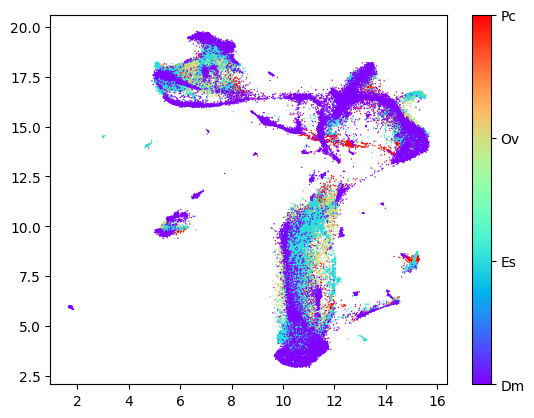

In [3]:
samap.scatter(c='species', s=1)

## Mapping scores between leiden clusters

In [6]:
keys = {'Pc':'samap_anno','Ov':'samap_anno', 'Es': 'samap_anno', 'Dm': 'samap_anno'}
D,MappingTable = get_mapping_scores(sm,keys,n_top = 0)

In [7]:
MappingTable.to_csv('figures/paper/Figure 9/MappingTable_OvEsPcDm.csv', header=True)

# plotting

In [9]:
sankey_plot(MappingTable, align_thr=0.2, species_order = ['Pc', 'Ov', 'Es', 'Dm'])

:Sankey   [source,target]   (Value)

# Create own chord plot with matplotlib 
mpl-chord-diagram

<Figure size 800x800 with 0 Axes>

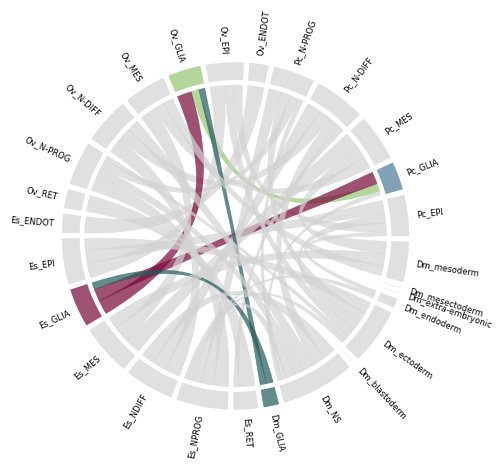

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_chord_diagram import chord_diagram

# your SAMap MappingTable
mt = MappingTable.copy()

# optional: remove self-links
np.fill_diagonal(mt.values, 0)

# optional: threshold
threshold = 0.2
mt = mt.where(mt > threshold, 0)

highlight_clusters = [
    #"Pc_N-PROG","Ov_N-PROG","Es_N-PROG",
    #"Pc_N-DIFF","Ov_N-DIFF","Es_N-DIFF","Dm_NS",
    "Pc_GLIA","Ov_GLIA","Es_GLIA","Dm_GLIA"
]

highlight_set = set(highlight_clusters)

def cluster_color(name):
    if name not in highlight_set:
        return "#d3d3d3"   # grey for background clusters
    
    # optional: color by species for highlighted ones
    sp = name.split("_")[0]
    return {
        "Pc": "#4a7c99",
        "Ov": "#93C572",
        "Es": "#770737",
        "Dm": "#235a5a"
    }.get(sp, "#888888")

colors = [cluster_color(c) for c in mt.index]

fig = plt.figure(figsize=(8,8))

chord_diagram(
    mt.values,
    names=mt.index.tolist(),
    colors=colors,
    fontsize=6,
    rotate_names=90,
    chord_colors=colors,  # edges inherit node color
    alpha=0.7,
    show=False
)

plt.savefig('figures/paper/Figure 9/chord_plot.pdf', dpi=300)
plt.show()

<Figure size 2400x2400 with 0 Axes>

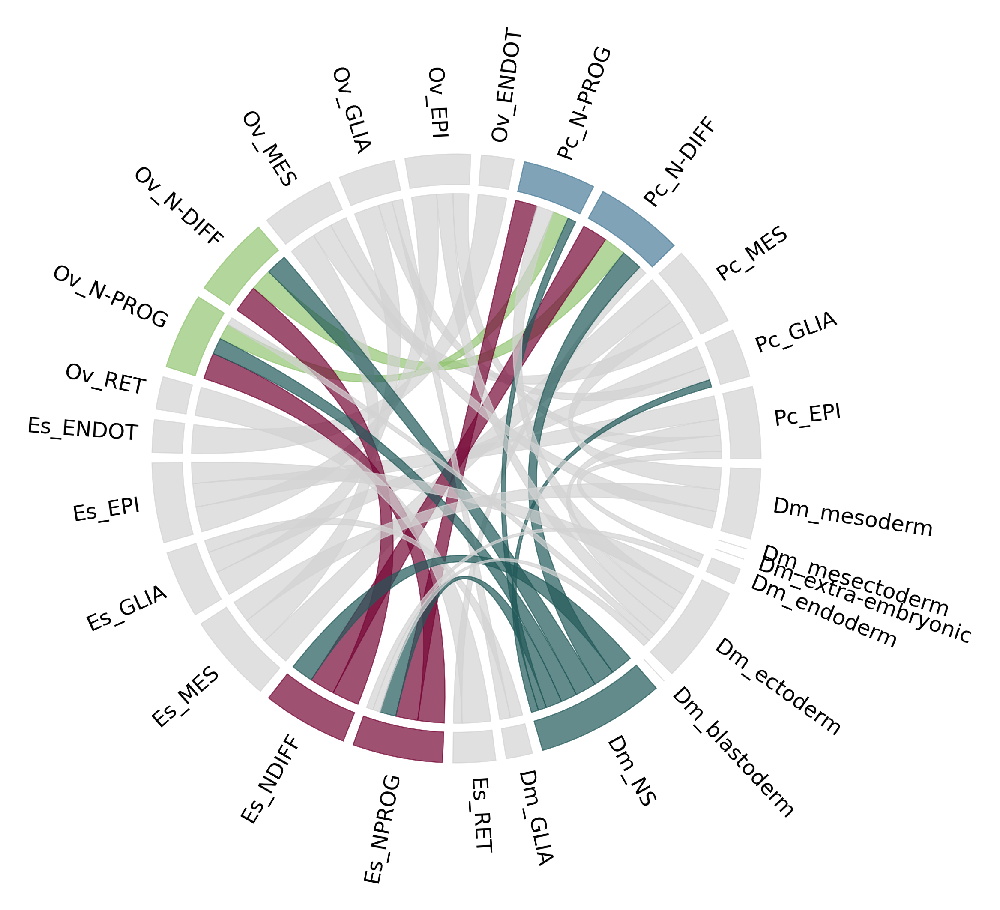

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_chord_diagram import chord_diagram

# your SAMap MappingTable
mt = MappingTable.copy()

# optional: remove self-links
np.fill_diagonal(mt.values, 0)

# optional: threshold
threshold = 0.2
mt = mt.where(mt > threshold, 0)

highlight_clusters = [
    "Pc_N-PROG","Ov_N-PROG","Es_NPROG",
    "Pc_N-DIFF","Ov_N-DIFF","Es_NDIFF","Dm_NS",
    #"Pc_GLIA","Ov_GLIA","Es_GLIA","Dm_GLIA"
]

highlight_set = set(highlight_clusters)

def cluster_color(name):
    if name not in highlight_set:
        return "#d3d3d3"   # grey for background clusters
    
    # optional: color by species for highlighted ones
    sp = name.split("_")[0]
    return {
        "Pc": "#4a7c99",
        "Ov": "#93C572",
        "Es": "#770737",
        "Dm": "#235a5a"
    }.get(sp, "#888888")

colors = [cluster_color(c) for c in mt.index]

fig = plt.figure(figsize=(8,8))

chord_diagram(
    mt.values,
    names=mt.index.tolist(),
    colors=colors,
    fontsize=6,
    rotate_names=90,
    chord_colors=colors,  # edges inherit node color
    alpha=0.7,
    show=False
)

plt.savefig('figures/paper/Figure 9/chord_plot_neuro.pdf', dpi=300)
plt.show()

# feature plots

for umaps, remove the two Dm clusters that disturb the size of the plot

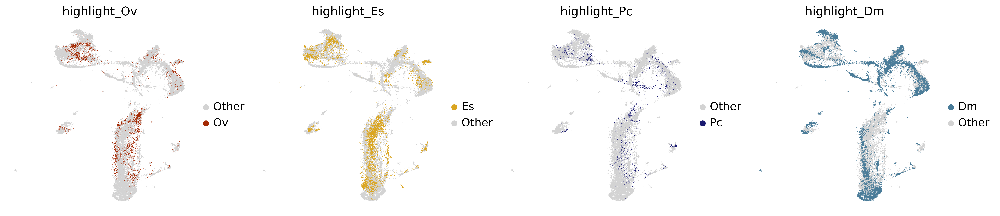

In [13]:
import scanpy as sc

sc.settings.set_figure_params(dpi=300, facecolor="white", color_map='plasma', frameon=False)
sc.settings.figdir = 'figures/paper/Figure 9/'

# anno_colors = ['#93C572', # NDIFF
#                 '#E3735E', # MES
#                 '#235a5a', # EPI
#                 '#4a7c99', # NPROG
#                 '#F3CFC6', # RET
#                 '#770737', # GLIA
#                 '#d3d3d3'  # ENDOT
#                ] 

batch_colors = {'Es': '#DAA520',
                'Ov': '#A42A04', 
                'Pc': '#191970',
                'Dm': '#4a7c99',
                'Other': '#d3d3d3'
               }

samap.adata.obs['highlight_Ov'] = samap.adata.obs['species'].apply(lambda x: x if x == 'Ov' else 'Other')
samap.adata.obs['highlight_Es'] = samap.adata.obs['species'].apply(lambda x: x if x == 'Es' else 'Other')
samap.adata.obs['highlight_Pc'] = samap.adata.obs['species'].apply(lambda x: x if x == 'Pc' else 'Other')
samap.adata.obs['highlight_Dm'] = samap.adata.obs['species'].apply(lambda x: x if x == 'Dm' else 'Other')

sc.pl.embedding(samap.adata, color=['highlight_Ov', 'highlight_Es', 'highlight_Pc', 'highlight_Dm'], basis='X_umap', palette = batch_colors, size=1,
               save='_sub_species_highlighted.pdf')

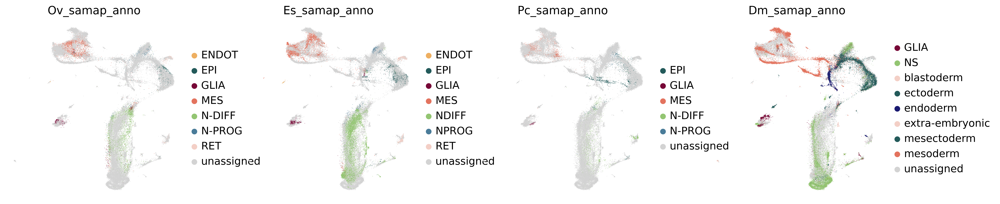

In [14]:
import scanpy as sc

sc.settings.set_figure_params(dpi=300, facecolor="white", color_map='plasma', frameon=False)
sc.settings.figdir = 'figures/paper/Figure 9/'

anno_colors = {'NDIFF':            '#93C572',
               'N-DIFF':           '#93C572',
               'NS':               '#93C572',
               'MES':              '#E3735E',
               'endoderm':         '#191970',
               'mesoderm':         '#E3735E',
               'EPI':              '#235a5a',
               'ectoderm':         '#235a5a',
               'mesectoderm':      '#235a5a',
               'N-PROG':           '#4a7c99',
               'NPROG':            '#4a7c99',
               'RET':              '#F3CFC6',
               'GLIA':             '#770737',
               'astrocyte glia':   '#770737',
               'ENDOT':            '#eeaf61',
               'ENDO':             '#eeaf61',  
               'blastoderm':       '#F3CFC6',
               'extra-embryonic':  '#F3CFC6',
               'chiasm glia':      '#DAA520',
               'chordotonal glia': '#DAA520',
               'glioblasts':       '#4a7c99',
               'sensory glia':     '#DAA520',
               'surface glia':     '#DAA520',
               'unassigned':       '#d3d3d3', 
              }

batch_colors = {'Es': '#DAA520',
                'Ov': '#A42A04', 
                'Pc': '#191970',
                'Other': '#d3d3d3'
               }

sc.pl.embedding(samap.adata, color=['Ov_samap_anno', 'Es_samap_anno', 'Pc_samap_anno', 'Dm_samap_anno'], basis='X_umap', palette = anno_colors, 
                size=1,
               save='_sub_species_annotations.pdf')

# violin plots

In [4]:
# create a merged samap_anno column

import pandas as pd

def add_species_prefix(row):
    if row["Ov_samap_anno"] != "unassigned":
        return "Ov_" + row["Ov_samap_anno"]
    elif row["Es_samap_anno"] != "unassigned":
        return "Es_" + row["Es_samap_anno"]
    elif row["Pc_samap_anno"] != "unassigned":
        return "Pc_" + row["Pc_samap_anno"]
    elif row["Dm_samap_anno"] != "unassigned":
        return "Dm_" + row["Dm_samap_anno"]
    else:
        return "unassigned"

samap.adata.obs["samap_cluster"] = samap.adata.obs.apply(add_species_prefix, axis=1)

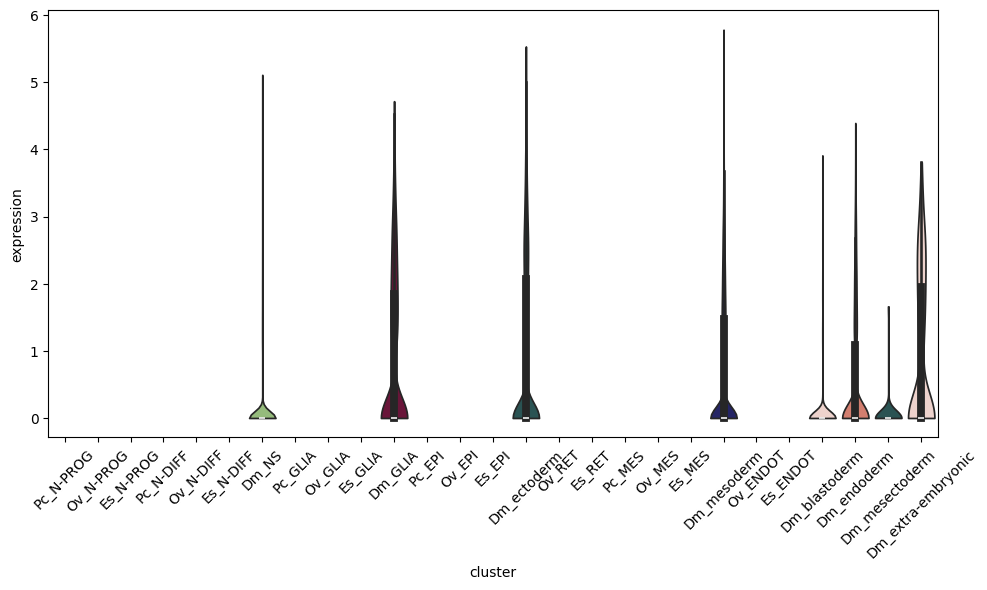

In [5]:
import pandas as pd
import numpy as np

# ttk

pltdir = 'figures/paper/Figure 9/violinplots/Dm_ttk.pdf'

genes = ["Dm_ttk"]
species_gene_map = {
    "Dm": "Dm_ttk"
}


order = [
    "Pc_N-PROG","Ov_N-PROG","Es_N-PROG",
    "Pc_N-DIFF","Ov_N-DIFF","Es_N-DIFF","Dm_NS",
    "Pc_GLIA","Ov_GLIA","Es_GLIA","Dm_GLIA",
    "Pc_EPI","Ov_EPI","Es_EPI","Dm_ectoderm",
    "Ov_RET","Es_RET",
    "Pc_MES","Ov_MES","Es_MES", "Dm_mesoderm",
    "Ov_ENDOT","Es_ENDOT",
    "Dm_blastoderm", "Dm_endoderm", "Dm_mesectoderm", "Dm_extra-embryonic",
]

anno_colors = {'Ov_N-PROG':           '#4a7c99',
               'Es_N-PROG':           '#4a7c99',
               'Pc_N-PROG':           '#4a7c99',
               'Ov_N-DIFF':           '#93C572',
               'Es_N-DIFF':           '#93C572',
               'Pc_N-DIFF':           '#93C572',
               'Dm_NS':               '#93C572',
               'Ov_GLIA':             '#770737',
               'Es_GLIA':             '#770737',
               'Pc_GLIA':             '#770737',
               'Dm_GLIA':             '#770737',
               'Ov_EPI':              '#235a5a',
               'Es_EPI':              '#235a5a',
               'Pc_EPI':              '#235a5a',
               'Dm_ectoderm':         '#235a5a',
               'Ov_RET':              '#F3CFC6',
               'Es_RET':              '#F3CFC6',
               'Ov_MES':              '#E3735E',
               'Es_MES':              '#E3735E',
               'Pc_MES':              '#E3735E',
               'Ov_ENDOT':            '#eeaf61',
               'Es_ENDOT':            '#eeaf61',
               'Dm_mesoderm':         '#191970',
               'Dm_endoderm':         '#E3735E',
               'Dm_mesectoderm':      '#235a5a',
               'Dm_blastoderm':       '#F3CFC6',
               'Dm_extra-embryonic':  '#F3CFC6',
              }

# extract expression
expr = samap.adata[:, genes].X
if hasattr(expr, "toarray"):
    expr = expr.toarray()

df = pd.DataFrame(expr, columns=genes, index=samap.adata.obs_names)
df["cluster"] = samap.adata.obs["samap_cluster"].values

# convert to long format
plot_df = df.melt(
    id_vars="cluster",
    var_name="gene",
    value_name="expression"
)
# extract species from cluster
plot_df["species"] = plot_df["cluster"].str.split("_").str[0]
plot_df = plot_df[~plot_df['species'].isin(['Es', 'Ov', 'Pc'])]

# keep matching gene per species
plot_df = plot_df[
    plot_df.apply(
        lambda x: species_gene_map[x["species"]] == x["gene"],
        axis=1
    )
]

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.violinplot(
    data=plot_df,
    x="cluster",
    y="expression",
    order=order,
    palette=anno_colors,
    cut=0
)

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(pltdir, dpi=300)
plt.show()

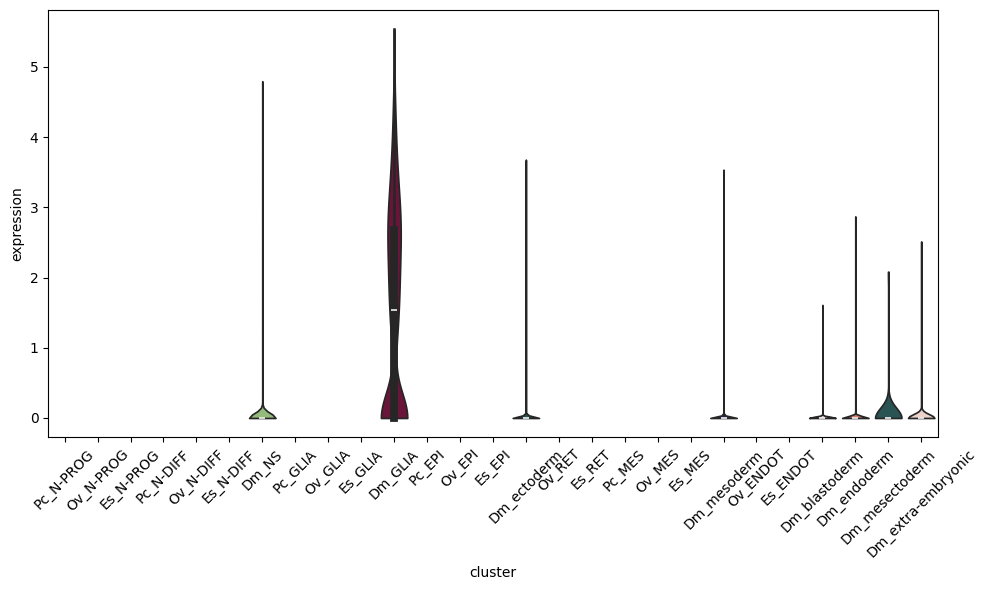

In [6]:
import pandas as pd
import numpy as np

# repo

pltdir = 'figures/paper/Figure 9/violinplots/Dm_repo.pdf'

genes = ["Dm_repo"]
species_gene_map = {
    "Dm": "Dm_repo"
}


order = [
    "Pc_N-PROG","Ov_N-PROG","Es_N-PROG",
    "Pc_N-DIFF","Ov_N-DIFF","Es_N-DIFF","Dm_NS",
    "Pc_GLIA","Ov_GLIA","Es_GLIA","Dm_GLIA",
    "Pc_EPI","Ov_EPI","Es_EPI","Dm_ectoderm",
    "Ov_RET","Es_RET",
    "Pc_MES","Ov_MES","Es_MES", "Dm_mesoderm",
    "Ov_ENDOT","Es_ENDOT",
    "Dm_blastoderm", "Dm_endoderm", "Dm_mesectoderm", "Dm_extra-embryonic",
]

anno_colors = {'Ov_N-PROG':           '#4a7c99',
               'Es_N-PROG':           '#4a7c99',
               'Pc_N-PROG':           '#4a7c99',
               'Ov_N-DIFF':           '#93C572',
               'Es_N-DIFF':           '#93C572',
               'Pc_N-DIFF':           '#93C572',
               'Dm_NS':               '#93C572',
               'Ov_GLIA':             '#770737',
               'Es_GLIA':             '#770737',
               'Pc_GLIA':             '#770737',
               'Dm_GLIA':             '#770737',
               'Ov_EPI':              '#235a5a',
               'Es_EPI':              '#235a5a',
               'Pc_EPI':              '#235a5a',
               'Dm_ectoderm':         '#235a5a',
               'Ov_RET':              '#F3CFC6',
               'Es_RET':              '#F3CFC6',
               'Ov_MES':              '#E3735E',
               'Es_MES':              '#E3735E',
               'Pc_MES':              '#E3735E',
               'Ov_ENDOT':            '#eeaf61',
               'Es_ENDOT':            '#eeaf61',
               'Dm_mesoderm':         '#191970',
               'Dm_endoderm':         '#E3735E',
               'Dm_mesectoderm':      '#235a5a',
               'Dm_blastoderm':       '#F3CFC6',
               'Dm_extra-embryonic':  '#F3CFC6',
              }

# extract expression
expr = samap.adata[:, genes].X
if hasattr(expr, "toarray"):
    expr = expr.toarray()

df = pd.DataFrame(expr, columns=genes, index=samap.adata.obs_names)
df["cluster"] = samap.adata.obs["samap_cluster"].values

# convert to long format
plot_df = df.melt(
    id_vars="cluster",
    var_name="gene",
    value_name="expression"
)
# extract species from cluster
plot_df["species"] = plot_df["cluster"].str.split("_").str[0]
plot_df = plot_df[~plot_df['species'].isin(['Es', 'Ov', 'Pc'])]

# keep matching gene per species
plot_df = plot_df[
    plot_df.apply(
        lambda x: species_gene_map[x["species"]] == x["gene"],
        axis=1
    )
]

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.violinplot(
    data=plot_df,
    x="cluster",
    y="expression",
    order=order,
    palette=anno_colors,
    cut=0
)

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(pltdir, dpi=300)
plt.show()

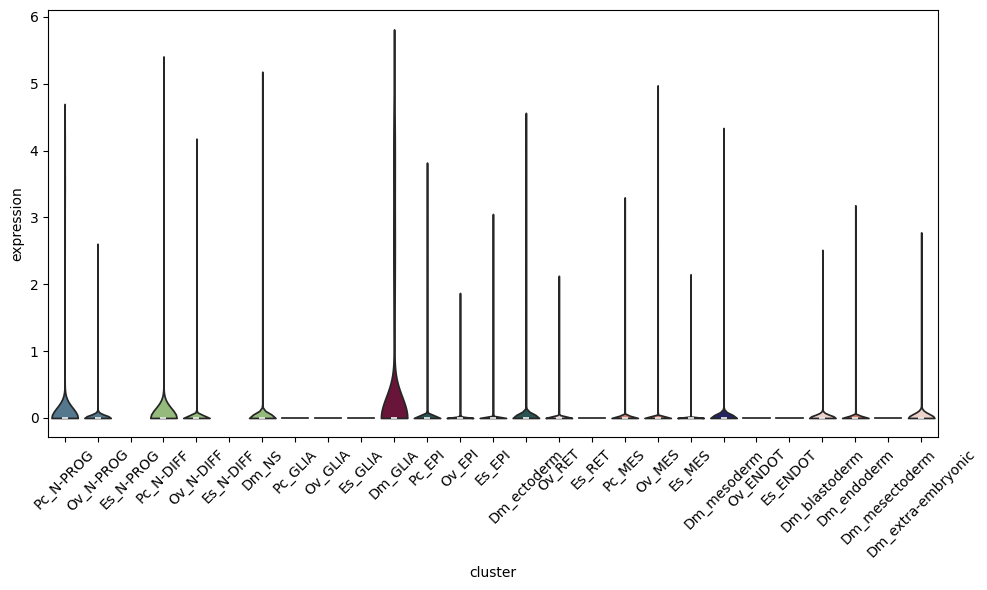

In [7]:
import pandas as pd
import numpy as np

# GCM

pltdir = 'figures/paper/Figure 9/violinplots/all_gcm.pdf'

genes = ["Pc_LOC112574407", 'Es_LOC145297009', "Ov_OctVul6B013114", "Dm_gcm"]
species_gene_map = {
    "Pc": "Pc_LOC112574407",
    "Es": "Es_LOC145297009",
    "Ov": "Ov_OctVul6B013114",
    "Dm": "Dm_gcm"
}


order = [
    "Pc_N-PROG","Ov_N-PROG","Es_N-PROG",
    "Pc_N-DIFF","Ov_N-DIFF","Es_N-DIFF","Dm_NS",
    "Pc_GLIA","Ov_GLIA","Es_GLIA","Dm_GLIA",
    "Pc_EPI","Ov_EPI","Es_EPI","Dm_ectoderm",
    "Ov_RET","Es_RET",
    "Pc_MES","Ov_MES","Es_MES", "Dm_mesoderm",
    "Ov_ENDOT","Es_ENDOT",
    "Dm_blastoderm", "Dm_endoderm", "Dm_mesectoderm", "Dm_extra-embryonic",
]

anno_colors = {'Ov_N-PROG':           '#4a7c99',
               'Es_N-PROG':           '#4a7c99',
               'Pc_N-PROG':           '#4a7c99',
               'Ov_N-DIFF':           '#93C572',
               'Es_N-DIFF':           '#93C572',
               'Pc_N-DIFF':           '#93C572',
               'Dm_NS':               '#93C572',
               'Ov_GLIA':             '#770737',
               'Es_GLIA':             '#770737',
               'Pc_GLIA':             '#770737',
               'Dm_GLIA':             '#770737',
               'Ov_EPI':              '#235a5a',
               'Es_EPI':              '#235a5a',
               'Pc_EPI':              '#235a5a',
               'Dm_ectoderm':         '#235a5a',
               'Ov_RET':              '#F3CFC6',
               'Es_RET':              '#F3CFC6',
               'Ov_MES':              '#E3735E',
               'Es_MES':              '#E3735E',
               'Pc_MES':              '#E3735E',
               'Ov_ENDOT':            '#eeaf61',
               'Es_ENDOT':            '#eeaf61',
               'Dm_mesoderm':         '#191970',
               'Dm_endoderm':         '#E3735E',
               'Dm_mesectoderm':      '#235a5a',
               'Dm_blastoderm':       '#F3CFC6',
               'Dm_extra-embryonic':  '#F3CFC6',
              }

# extract expression
expr = samap.adata[:, genes].X
if hasattr(expr, "toarray"):
    expr = expr.toarray()

df = pd.DataFrame(expr, columns=genes, index=samap.adata.obs_names)
df["cluster"] = samap.adata.obs["samap_cluster"].values

# convert to long format
plot_df = df.melt(
    id_vars="cluster",
    var_name="gene",
    value_name="expression"
)
# extract species from cluster
plot_df["species"] = plot_df["cluster"].str.split("_").str[0]
#plot_df = plot_df[plot_df['species'] != 'Es']

# keep matching gene per species
plot_df = plot_df[
    plot_df.apply(
        lambda x: species_gene_map[x["species"]] == x["gene"],
        axis=1
    )
]

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.violinplot(
    data=plot_df,
    x="cluster",
    y="expression",
    order=order,
    palette=anno_colors,
    cut=0
)

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(pltdir, dpi=300)
plt.show()

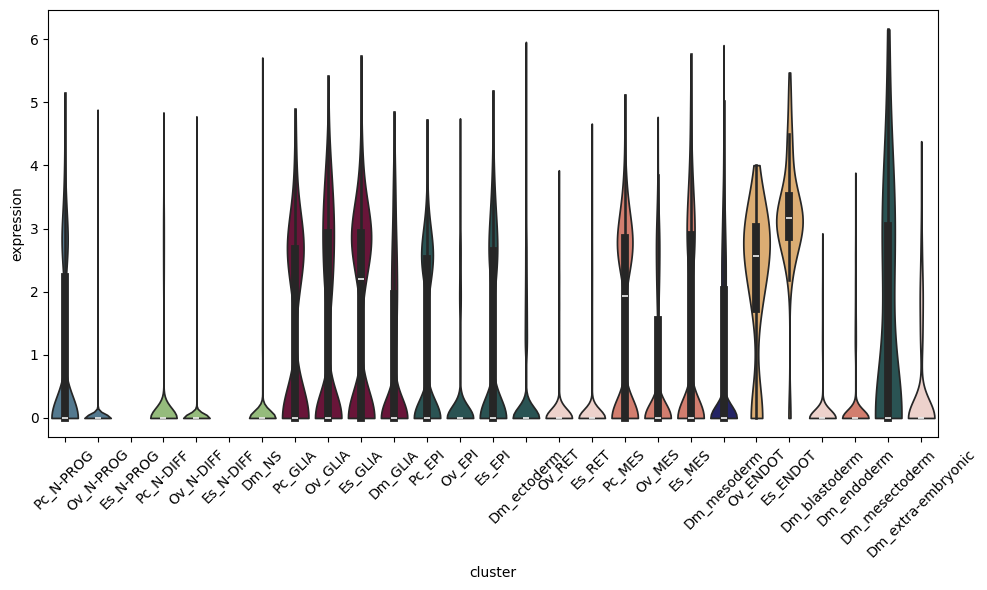

In [8]:
import pandas as pd
import numpy as np

# Pointed

pltdir = 'figures/paper/Figure 9/violinplots/all_pnt.pdf'

genes = ["Pc_LOC112568870", "Es_LOC145248838", "Ov_OctVul6B022853", "Dm_pnt"]
species_gene_map = {
    "Pc": "Pc_LOC112568870",
    "Es": "Es_LOC145248838",
    "Ov": "Ov_OctVul6B022853",
    "Dm": "Dm_pnt"
}


order = [
    "Pc_N-PROG","Ov_N-PROG","Es_N-PROG",
    "Pc_N-DIFF","Ov_N-DIFF","Es_N-DIFF","Dm_NS",
    "Pc_GLIA","Ov_GLIA","Es_GLIA","Dm_GLIA",
    "Pc_EPI","Ov_EPI","Es_EPI","Dm_ectoderm",
    "Ov_RET","Es_RET",
    "Pc_MES","Ov_MES","Es_MES", "Dm_mesoderm",
    "Ov_ENDOT","Es_ENDOT",
    "Dm_blastoderm", "Dm_endoderm", "Dm_mesectoderm", "Dm_extra-embryonic",
]

anno_colors = {'Ov_N-PROG':           '#4a7c99',
               'Es_N-PROG':           '#4a7c99',
               'Pc_N-PROG':           '#4a7c99',
               'Ov_N-DIFF':           '#93C572',
               'Es_N-DIFF':           '#93C572',
               'Pc_N-DIFF':           '#93C572',
               'Dm_NS':               '#93C572',
               'Ov_GLIA':             '#770737',
               'Es_GLIA':             '#770737',
               'Pc_GLIA':             '#770737',
               'Dm_GLIA':             '#770737',
               'Ov_EPI':              '#235a5a',
               'Es_EPI':              '#235a5a',
               'Pc_EPI':              '#235a5a',
               'Dm_ectoderm':         '#235a5a',
               'Ov_RET':              '#F3CFC6',
               'Es_RET':              '#F3CFC6',
               'Ov_MES':              '#E3735E',
               'Es_MES':              '#E3735E',
               'Pc_MES':              '#E3735E',
               'Ov_ENDOT':            '#eeaf61',
               'Es_ENDOT':            '#eeaf61',
               'Dm_mesoderm':         '#191970',
               'Dm_endoderm':         '#E3735E',
               'Dm_mesectoderm':      '#235a5a',
               'Dm_blastoderm':       '#F3CFC6',
               'Dm_extra-embryonic':  '#F3CFC6',
              }

# extract expression
expr = samap.adata[:, genes].X
if hasattr(expr, "toarray"):
    expr = expr.toarray()

df = pd.DataFrame(expr, columns=genes, index=samap.adata.obs_names)
df["cluster"] = samap.adata.obs["samap_cluster"].values

# convert to long format
plot_df = df.melt(
    id_vars="cluster",
    var_name="gene",
    value_name="expression"
)
# extract species from cluster
plot_df["species"] = plot_df["cluster"].str.split("_").str[0]
#plot_df = plot_df[plot_df['species'] != 'Es']

# keep matching gene per species
plot_df = plot_df[
    plot_df.apply(
        lambda x: species_gene_map[x["species"]] == x["gene"],
        axis=1
    )
]

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.violinplot(
    data=plot_df,
    x="cluster",
    y="expression",
    order=order,
    palette=anno_colors,
    cut=0
)

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(pltdir, dpi=300)
plt.show()

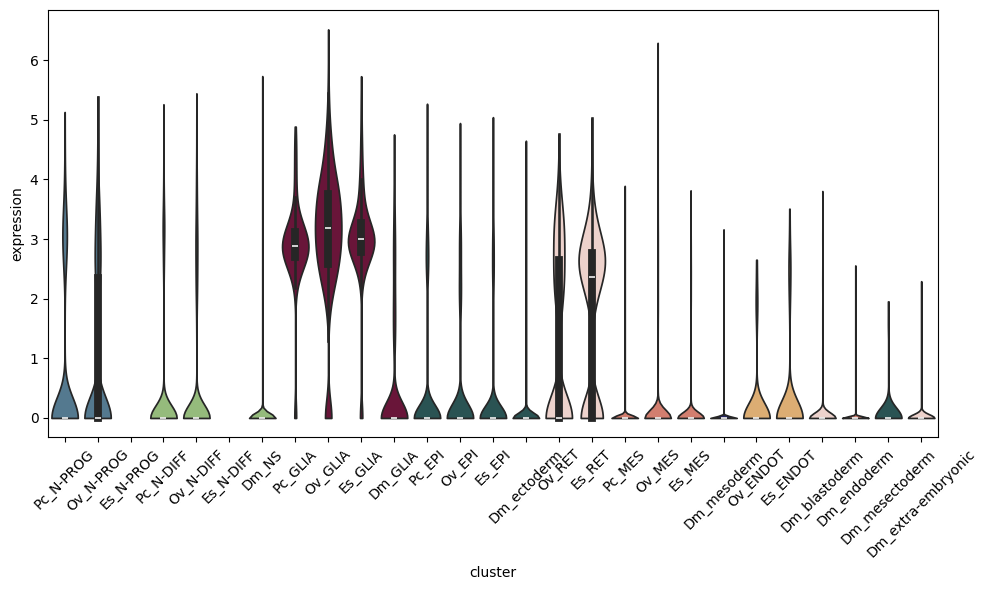

In [9]:
import pandas as pd
import numpy as np

# DLX

pltdir = 'figures/paper/Figure 9/violinplots/all_dlx.pdf'

genes = ["Pc_LOC112557455", "Es_LOC145284533", "Ov_OctVul6B029372", "Dm_Dll"]
species_gene_map = {
    "Pc": "Pc_LOC112557455",
    "Es": "Es_LOC145284533",
    "Ov": "Ov_OctVul6B029372",
    "Dm": "Dm_Dll"
}


order = [
    "Pc_N-PROG","Ov_N-PROG","Es_N-PROG",
    "Pc_N-DIFF","Ov_N-DIFF","Es_N-DIFF","Dm_NS",
    "Pc_GLIA","Ov_GLIA","Es_GLIA","Dm_GLIA",
    "Pc_EPI","Ov_EPI","Es_EPI","Dm_ectoderm",
    "Ov_RET","Es_RET",
    "Pc_MES","Ov_MES","Es_MES", "Dm_mesoderm",
    "Ov_ENDOT","Es_ENDOT",
    "Dm_blastoderm", "Dm_endoderm", "Dm_mesectoderm", "Dm_extra-embryonic",
]

anno_colors = {'Ov_N-PROG':           '#4a7c99',
               'Es_N-PROG':           '#4a7c99',
               'Pc_N-PROG':           '#4a7c99',
               'Ov_N-DIFF':           '#93C572',
               'Es_N-DIFF':           '#93C572',
               'Pc_N-DIFF':           '#93C572',
               'Dm_NS':               '#93C572',
               'Ov_GLIA':             '#770737',
               'Es_GLIA':             '#770737',
               'Pc_GLIA':             '#770737',
               'Dm_GLIA':             '#770737',
               'Ov_EPI':              '#235a5a',
               'Es_EPI':              '#235a5a',
               'Pc_EPI':              '#235a5a',
               'Dm_ectoderm':         '#235a5a',
               'Ov_RET':              '#F3CFC6',
               'Es_RET':              '#F3CFC6',
               'Ov_MES':              '#E3735E',
               'Es_MES':              '#E3735E',
               'Pc_MES':              '#E3735E',
               'Ov_ENDOT':            '#eeaf61',
               'Es_ENDOT':            '#eeaf61',
               'Dm_mesoderm':         '#191970',
               'Dm_endoderm':         '#E3735E',
               'Dm_mesectoderm':      '#235a5a',
               'Dm_blastoderm':       '#F3CFC6',
               'Dm_extra-embryonic':  '#F3CFC6',
              }

# extract expression
expr = samap.adata[:, genes].X
if hasattr(expr, "toarray"):
    expr = expr.toarray()

df = pd.DataFrame(expr, columns=genes, index=samap.adata.obs_names)
df["cluster"] = samap.adata.obs["samap_cluster"].values

# convert to long format
plot_df = df.melt(
    id_vars="cluster",
    var_name="gene",
    value_name="expression"
)
# extract species from cluster
plot_df["species"] = plot_df["cluster"].str.split("_").str[0]
#plot_df = plot_df[plot_df['species'] != 'Es']

# keep matching gene per species
plot_df = plot_df[
    plot_df.apply(
        lambda x: species_gene_map[x["species"]] == x["gene"],
        axis=1
    )
]

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.violinplot(
    data=plot_df,
    x="cluster",
    y="expression",
    order=order,
    palette=anno_colors,
    cut=0
)

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(pltdir, dpi=300)
plt.show()

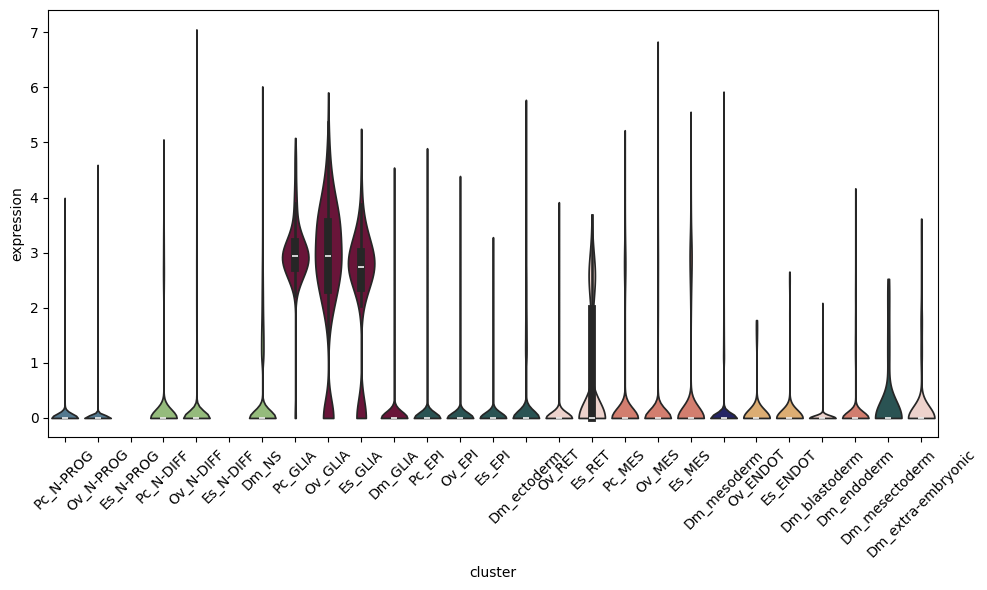

In [10]:
import pandas as pd
import numpy as np

# NR4A

pltdir = 'figures/paper/Figure 9/violinplots/all_nr4a.pdf'

genes = ["Pc_LOC112566404", "Ov_OctVul6B008109", "Es_LOC145247806", "Dm_Hr39"]
species_gene_map = {
    "Pc": "Pc_LOC112566404",
    "Ov": "Ov_OctVul6B008109",
    "Es": "Es_LOC145247806",
    "Dm": "Dm_Hr39"
}


order = [
    "Pc_N-PROG","Ov_N-PROG","Es_N-PROG",
    "Pc_N-DIFF","Ov_N-DIFF","Es_N-DIFF","Dm_NS",
    "Pc_GLIA","Ov_GLIA","Es_GLIA","Dm_GLIA",
    "Pc_EPI","Ov_EPI","Es_EPI","Dm_ectoderm",
    "Ov_RET","Es_RET",
    "Pc_MES","Ov_MES","Es_MES", "Dm_mesoderm",
    "Ov_ENDOT","Es_ENDOT",
    "Dm_blastoderm", "Dm_endoderm", "Dm_mesectoderm", "Dm_extra-embryonic",
]

anno_colors = {'Ov_N-PROG':           '#4a7c99',
               'Es_N-PROG':           '#4a7c99',
               'Pc_N-PROG':           '#4a7c99',
               'Ov_N-DIFF':           '#93C572',
               'Es_N-DIFF':           '#93C572',
               'Pc_N-DIFF':           '#93C572',
               'Dm_NS':               '#93C572',
               'Ov_GLIA':             '#770737',
               'Es_GLIA':             '#770737',
               'Pc_GLIA':             '#770737',
               'Dm_GLIA':             '#770737',
               'Ov_EPI':              '#235a5a',
               'Es_EPI':              '#235a5a',
               'Pc_EPI':              '#235a5a',
               'Dm_ectoderm':         '#235a5a',
               'Ov_RET':              '#F3CFC6',
               'Es_RET':              '#F3CFC6',
               'Ov_MES':              '#E3735E',
               'Es_MES':              '#E3735E',
               'Pc_MES':              '#E3735E',
               'Ov_ENDOT':            '#eeaf61',
               'Es_ENDOT':            '#eeaf61',
               'Dm_mesoderm':         '#191970',
               'Dm_endoderm':         '#E3735E',
               'Dm_mesectoderm':      '#235a5a',
               'Dm_blastoderm':       '#F3CFC6',
               'Dm_extra-embryonic':  '#F3CFC6',
              }

# extract expression
expr = samap.adata[:, genes].X
if hasattr(expr, "toarray"):
    expr = expr.toarray()

df = pd.DataFrame(expr, columns=genes, index=samap.adata.obs_names)
df["cluster"] = samap.adata.obs["samap_cluster"].values

# convert to long format
plot_df = df.melt(
    id_vars="cluster",
    var_name="gene",
    value_name="expression"
)
# extract species from cluster
plot_df["species"] = plot_df["cluster"].str.split("_").str[0]
# keep matching gene per species
plot_df = plot_df[
    plot_df.apply(
        lambda x: species_gene_map[x["species"]] == x["gene"],
        axis=1
    )
]

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.violinplot(
    data=plot_df,
    x="cluster",
    y="expression",
    order=order,
    palette=anno_colors,
    cut=0
)

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(pltdir, dpi=300)
plt.show()

In [16]:
div = len(Pc.obs)  
xv = len(XV.obs)/div

In [17]:
import numpy as np

# Random reproducible seed
np.random.seed(33)  # Annas number

In [18]:
cell_indices = np.arange(XV.n_obs)
subset_indices = np.random.choice(cell_indices, size= int(XV.n_obs // xv), replace=False)
print(len(cell_indices))
print(len(subset_indices))

42785
11703


In [19]:
# Subset the AnnData object
XV_subset = XV[subset_indices, :]
XV_subset

View of AnnData object with n_obs × n_vars = 11703 × 42142
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-XV_1', 'cellbender_analyzed-XV_1', 'n_raw-XV_1', 'n_cellbender-XV_1', 'n_cells-XV_1', 'n_cells_by_counts-XV_1', 'mean_counts-XV_1', 'pct_dropout_by_counts-XV_1', 'total_counts-XV_1', 'ambient_expression-XV_2', 'cellbender_analyzed-XV_2', 'n_raw-XV_2', 'n_cellbender-XV_2', 'n_cells-XV_2', 'n_cells_by_counts-XV_2', 'mean_counts-XV_2', 'pct_dropout_by_counts-XV_2', 'total_counts-XV_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg'
    obsm: 'cellbender_embedding'
    layers: 'cellbender', 'raw'

In [20]:
XV_subset.obs_names

Index(['ATCCAATAGTAGTCAT-1-XV_1', 'TAAGCAGGTTGCGTAT-1-XV_2',
       'AAGCCCCGTCAGCCAC-1-XV_1', 'CAGTTAGTCTATCAGG-1-XV_1',
       'GTAAACCCAAGTGTGT-1-XV_1', 'ATAACGAAGGATCCCG-1-XV_2',
       'AATCCCAAGCATATCG-1-XV_2', 'GTCAAAGGTTTCCTCA-1-XV_1',
       'AGCATTGTCTAACCCT-1-XV_1', 'CAATATCAGGATGAAC-1-XV_1',
       ...
       'CTAAAGCCAACTAATG-1-XV_1', 'TCTCGAGGTAGCAGTA-1-XV_1',
       'TCATTAGGTTATGTCA-1-XV_1', 'CTAGCTGGTCAATGGA-1-XV_2',
       'GGATGCAAGAAGGTGT-1-XV_2', 'TGGTTTGAGGTAGTCC-1-XV_2',
       'CTAAGGGAGCCGATAC-1-XV_2', 'CGCTGCAAGCCTAAGC-1-XV_2',
       'TCGCCATCACTCAACC-1-XV_2', 'AGAGTCCTCAGGAGCA-1-XV_2'],
      dtype='object', name='barcode', length=11703)

In [21]:
import scanpy as sc
work_dir = '/staging/leuven/stg_00171/Mark/XV_snRNAseq_250424/cellbender_mergedPeaks/'
adata_anno = sc.read_h5ad(work_dir + 'XV_cb_sc_scr_merged_top2000_pca_harm.h5ad')

In [25]:
XV_subset.obs['coarse_anno'] = adata_anno.obs['basic_anno']

/tmp/ipykernel_2836788/303956654.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  XV_subset.obs['coarse_anno'] = adata_anno.obs['basic_anno']


In [30]:
XV_subset.obs['coarse_anno'].isna().drop_duplicates()

barcode
ATCCAATAGTAGTCAT-1-XV_1    False
Name: coarse_anno, dtype: bool

In [31]:
import scanpy as sc
work_dir = '/staging/leuven/stg_00171/Mark/XV_snRNAseq_250424/cellbender_mergedPeaks/'
XV_subset.write_h5ad(work_dir + 'XV_cb_sc_scr_merged_unscaled_samap.h5ad')

In [52]:
# Subset the AnnData object
XII_subset = XII[subset_indices, :]
XII_subset

View of AnnData object with n_obs × n_vars = 11703 × 32971
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'batch'
    var: 'feature_type', 'genome', 'gene_id', 'mt', 'ambient_expression-XII_1', 'cellbender_analyzed-XII_1', 'n_raw-XII_1', 'n_cellbender-XII_1', 'n_cells-XII_1', 'n_cells_by_counts-XII_1', 'mean_counts-XII_1', 'pct_dropout_by_counts-XII_1', 'total_counts-XII_1', 'ambient_expression-XII_2', 'cellbender_analyzed-XII_2', 'n_raw-XII_2', 'n_cellbender-XII_2', 'n_cells-XII_2', 'n_cells_by_counts-XII_2', 'mean_counts-XII_2', 'pct_dropout_by_counts-XII_2', 'total_counts-XII_2', 'ambient_expression-XII_3', 'cellbender_analyzed-XII_3', 'n_raw-XII_3', 'n_cellbender-XII_3', 'n_cells-XII_3', 'n_cells_by_counts-XII_3', 'mean_counts-XII_3', 'pct_dropout_by_counts-XII_3', 'total_counts-XII_3'
    obsm: 'c

In [53]:
XII_subset.obs_names

Index(['ACTTATCTCTCCATAT-1-XII_3', 'CCAGCCTGTCCTAGTT-1-XII_2',
       'TAGGTGCGTTTAGCGA-1-XII_1', 'GTATGTTCAGTATGTT-1-XII_3',
       'TACAGCTAGCTAATTG-1-XII_1', 'ATCCTCATCATGGTTA-1-XII_1',
       'TTGTGCCTCCTTAAGA-1-XII_2', 'GGACATAAGGACAACA-1-XII_2',
       'AGTTTGCAGCTCCTAC-1-XII_1', 'ACTTACTTCACGCATG-1-XII_2',
       ...
       'CGTCAATAGCCTGTTC-1-XII_1', 'TCCTTAGTCATTTAGG-1-XII_1',
       'TTAGCCTGTAAAGCAA-1-XII_1', 'AGTTTGATCGTCCTTA-1-XII_3',
       'TAGCCTCTCACAGACT-1-XII_2', 'CGCTATGAGCCTAACG-1-XII_2',
       'GGCAGGATCAATGTGC-1-XII_3', 'TAGCCTCTCAGCCAAT-1-XII_3',
       'CTTTATCAGTTCCCAC-1-XII_1', 'TTGGGCGGTGGATTCA-1-XII_3'],
      dtype='object', name='barcode', length=11703)

In [54]:
import scanpy as sc
work_dir = '/staging/leuven/stg_00171/Mark/XII_snMOseq_2022-12-13/cellbender/'
adata_anno = sc.read_h5ad(work_dir + 'XII_cb_sc_scr_merged_pca.h5ad')

In [56]:
XII_subset.obs['coarse_anno'] = adata_anno.obs['anno']

/tmp/ipykernel_2836788/1548513734.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  XII_subset.obs['coarse_anno'] = adata_anno.obs['anno']


In [58]:
XII_subset.obs['coarse_anno'].isna().drop_duplicates()

barcode
ACTTATCTCTCCATAT-1-XII_3    False
Name: coarse_anno, dtype: bool

In [59]:
import scanpy as sc
work_dir = '/staging/leuven/stg_00171/Mark/XII_snMOseq_2022-12-13/cellbender/'
XII_subset.write_h5ad(work_dir + 'XII_cb_sc_scr_merged_samap.h5ad')

In [60]:
Pc_dir = '/staging/leuven/stg_00171/Mark/Pcan_scRNAseq/scanpy_MAL003_reseq2/'
Pc = Pc_dir + 'adata_Pcan_S9_cb_sc_scr_coarse.h5ad'

Ov_dir = '/staging/leuven/stg_00171/Mark/XII_snMOseq_2022-12-13/cellbender/'
Ov = Ov_dir + 'XII_cb_sc_scr_merged_samap.h5ad'

In [61]:
import pandas as pd
mapA = pd.read_csv("/staging/leuven/stg_00171/Mark/Pcan_genome/Pcan_prot_to_gene_mapping.csv")
mapB = pd.read_csv("/staging/leuven/stg_00171/Mark/samap/proteomes/Ovul_prot_to_gene_mapping.csv")
mapA_drop = mapA.dropna(subset=["protein_id", "gene_id"])
mapB_drop = mapB.dropna(subset=["protein_id", "gene_id"])

In [62]:
map_dir = '/staging/leuven/stg_00171/Mark/samap/maps/'
filenames = {'Pc': Pc,'Ov': Ov}
names = {'Pc': mapA, 
         'Ov': mapB_drop
        }
keys = {'Pc': 'coarse_anno',
        'Ov': 'coarse_anno'
        }

# run SAMAP 
sm = SAMAP(
        filenames,
        f_maps = map_dir,
        names = names,
        keys = keys    
    )

Processing data Pc from:
/staging/leuven/stg_00171/Mark/Pcan_scRNAseq/scanpy_MAL003_reseq2/adata_Pcan_S9_cb_sc_scr_coarse.h5ad
RUNNING SAM
Iteration: 0, Convergence: 1.0
Iteration: 1, Convergence: 0.6878445628376237
Iteration: 2, Convergence: 0.024035962915294043
Computing the UMAP embedding...


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Elapsed time: 28.43356990814209 seconds
Not updating the manifold...
Processing data Ov from:
/staging/leuven/stg_00171/Mark/XII_snMOseq_2022-12-13/cellbender/XII_cb_sc_scr_merged_samap.h5ad


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/samalg/__init__.py:225: RuntimeWarning: divide by zero encountered in divide
  D = D.multiply(1 / s[:, None] * sum_norm).tocsr()


RUNNING SAM
Iteration: 0, Convergence: 1.0
Iteration: 1, Convergence: 0.7791109147274988
Iteration: 2, Convergence: 0.04031189542768743
Computing the UMAP embedding...


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Elapsed time: 20.764591455459595 seconds
Not updating the manifold...


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/samap/mapping.py:1184: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ss = ss[np.unique(q(ss.index),return_index=True)[1]]


14062 `Pc` gene symbols match between the datasets and the BLAST graph.
12265 `Ov` gene symbols match between the datasets and the BLAST graph.


In [63]:
sm.run(pairwise=True)
samap = sm.samap # SAM object with two species stitched together

Prepping datasets for translation.
Translating feature spaces pairwise.
Projecting data into joint latent space. 11.414325952529907
Correcting data with means. 12.942219257354736
Expanding neighbourhoods of species Pc...
Expanding neighbourhoods of species Ov...
Indegree coarsening
0/2 (0, 23406)
1/2 (20000, 23406)
Rescaling edge weights by expression correlations.
Concatenating SAM objects...
Iteration 1 complete.
Alignment scores:
          Ov        Pc
Ov  0.000000  0.804946
Pc  0.781382  0.000000
Calculating gene-gene correlations in the homology graph...
Prepping datasets for translation.
Translating feature spaces pairwise.
Projecting data into joint latent space. 10.208376169204712
Correcting data with means. 12.652817487716675
Expanding neighbourhoods of species Pc...
Expanding neighbourhoods of species Ov...
Indegree coarsening
0/2 (0, 23406)
1/2 (20000, 23406)
Rescaling edge weights by expression correlations.
Concatenating SAM objects...
Iteration 2 complete.
Alignment score

In [64]:
sm_xii = sm

In [110]:
import pickle
pickle.dump(
    sm_xii,
    open("/staging/leuven/stg_00171/Mark/samap/sm_Pc_S9_Ov_xii.pkl", "wb")
)

In [125]:
keys = {'Pc':'coarse_anno','Ov':'coarse_anno'}
D,MappingTable = get_mapping_scores(sm_xii,keys,n_top = 0)

In [128]:
sankey_plot(MappingTable, align_thr=0.1, species_order = ['Ov', 'Pc'])

/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  return pd.unique(values)
/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  return pd.unique(values)
/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  return pd.unique(values)
/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not 

:Sankey   [source,target]   (Value)

## read in apple snail dataset

In [69]:
import scanpy as sc
Pc_dir = '/staging/leuven/stg_00171/Mark/Pcan_scRNAseq/scanpy_MAL003_reseq2/'
Pc = sc.read_h5ad(Pc_dir + 'adata_Pcan_S9_cb_sc_scr_coarse.h5ad')

## read in IX dataset

In [89]:
import scanpy as sc
work_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/'
IX = sc.read_h5ad(work_dir + 'IX_cb_sc_scr.h5ad')

In [91]:
IX.obs_names

Index(['CCTAAGTAGCAACATC-1-IX_1', 'TTCAACCGTCCACAAA-1-IX_1',
       'TCGGTTCTCACCATTT-1-IX_1', 'AAGACCAAGCACCACA-1-IX_1',
       'GCTTAACAGGGATGCG-1-IX_1', 'CTTACCTCATGAAATG-1-IX_1',
       'AGCCGGTTCCTGCGAA-1-IX_1', 'TATCCGGAGCACTAGT-1-IX_1',
       'GTGCCTTTCATGTTTC-1-IX_1', 'GACCGAACATGCTATG-1-IX_1',
       ...
       'TGACACGCAAATTACG-1-IX_3', 'AGTGGAACATAAGGCT-1-IX_3',
       'TCCAGCTCAAATCCGG-1-IX_3', 'TATGGTTAGTACGCAC-1-IX_3',
       'GCGTGTTAGATTGCTG-1-IX_3', 'CCCATATTCCATTAGG-1-IX_3',
       'TGGTAGCTCCATCTAC-1-IX_3', 'ATCCAAGTCCTGTAAG-1-IX_3',
       'TAGTTCTCACAACCGA-1-IX_3', 'GTCCAGTAGCGCTTCC-1-IX_3'],
      dtype='object', name='barcode', length=37672)

In [85]:
import scanpy as sc
work_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/quality_subset/'
adata_anno = sc.read_h5ad(work_dir + 'IX_XII_XV_top2000_harm.h5ad')

In [86]:
IX_anno = adata_anno[adata_anno.obs['highlight_batch_IX'] == 'IX']

In [88]:
IX_anno.obs_names = IX_anno.obs_names.str.replace('-0', '')
IX_anno.obs_names

Index(['CGGTTTGGTAAGTAAC-1-IX_3', 'GCTTACCTCACCATTT-1-IX_1',
       'CGTTGCAAGCTATTAG-1-IX_1', 'TACGTTAAGGGTCCAC-1-IX_1',
       'CTAACCTGTAGCTGGT-1-IX_1', 'AAGCACCTCCATGTCT-1-IX_3',
       'CTGTTGAAGGATACTT-1-IX_3', 'TACTGTGAGCTAGACC-1-IX_3',
       'GGACATAGTCAAGTGA-1-IX_3', 'CTTATGAGTAACGTGA-1-IX_3',
       ...
       'AGTTGGCGTGACCTGG-1-IX_1', 'CCTAGCTCAATCCGCT-1-IX_3',
       'GCTCAACCAATGCCCG-1-IX_2', 'CGCTCATCATCCCGTG-1-IX_3',
       'GGACTAAAGCAAGACA-1-IX_2', 'GGGTAACGTAATGGAT-1-IX_3',
       'CACCTAAAGGTAGGGC-1-IX_3', 'GTGAGCGAGCATTTCT-1-IX_2',
       'CGTGAGGAGGATTGAG-1-IX_1', 'CTTTAGTTCTTGCTAT-1-IX_2'],
      dtype='object', name='barcode', length=23129)

In [93]:
IX.obs['coarse_anno'] = IX_anno.obs['coarse_anno']

In [119]:
IX.obs

,background_fraction,cell_probability,cell_size,droplet_efficiency,n_raw,n_cellbender,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,fixed_doublet,batch,coarse_anno
barcode,,,,,,,,,,,,,,,,
TCGGTTCTCACCATTT-1-IX_1,0.000900,0.999955,10821.399414,1.955815,19998,19980,8455,8455,19980,11,0.055055,0.327801,True,False,IX_1,RET
AAGACCAAGCACCACA-1-IX_1,0.001600,0.999955,10512.353516,2.016851,19994,19962,8462,8462,19962,56,0.280533,0.373550,True,False,IX_1,N-DIFF
CTTACCTCATGAAATG-1-IX_1,0.004984,0.999955,10905.128906,1.935622,20065,19965,7673,7673,19958,25,0.125263,0.314629,True,False,IX_1,MES
TATCCGGAGCACTAGT-1-IX_1,0.000201,0.999955,11258.142578,1.867047,19885,19881,9049,9049,19881,13,0.065389,0.391304,True,False,IX_1,N-PROG
GTGCCTTTCATGTTTC-1-IX_1,0.001006,0.999955,10732.457031,1.963549,19875,19855,8282,8282,19853,15,0.075555,0.454545,True,False,IX_1,N-PROG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TATGGTTAGTACGCAC-1-IX_3,0.276145,0.562633,2662.465088,0.515666,851,616,489,489,615,0,0.000000,0.023438,False,False,IX_3,MES
GCGTGTTAGATTGCTG-1-IX_3,0.189635,0.531645,2627.087158,0.526180,849,688,400,400,686,0,0.000000,0.060377,False,False,IX_3,N-DIFF
ATCCAAGTCCTGTAAG-1-IX_3,0.426129,0.506792,2608.316650,0.515316,819,470,307,307,470,0,0.000000,0.022241,False,False,IX_3,N-PROG


In [94]:
IX.obs['coarse_anno'].isna().drop_duplicates()

barcode
CCTAAGTAGCAACATC-1-IX_1     True
TCGGTTCTCACCATTT-1-IX_1    False
Name: coarse_anno, dtype: bool

In [96]:
IX = IX[~IX.obs['coarse_anno'].isna()]

In [97]:
IX.obs['coarse_anno'].isna().drop_duplicates()

barcode
TCGGTTCTCACCATTT-1-IX_1    False
Name: coarse_anno, dtype: bool

In [99]:
import numpy as np

# Random reproducible seed
np.random.seed(33)  # Annas number

div = len(Pc.obs)  
ix = len(IX.obs)/div

cell_indices = np.arange(IX.n_obs)
subset_indices = np.random.choice(cell_indices, size= int(IX.n_obs // ix)+1, replace=False)
print(len(cell_indices))
print(len(subset_indices))

23129
11703


In [100]:
# Subset the AnnData object
IX_subset = IX[subset_indices, :]
IX_subset

View of AnnData object with n_obs × n_vars = 11703 × 18667
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'fixed_doublet', 'batch', 'coarse_anno'
    var: 'gene_id', 'mt', 'ambient_expression-IX_1', 'feature_type-IX_1', 'genome-IX_1', 'cellbender_analyzed-IX_1', 'n_raw-IX_1', 'n_cellbender-IX_1', 'n_cells-IX_1', 'n_cells_by_counts-IX_1', 'mean_counts-IX_1', 'pct_dropout_by_counts-IX_1', 'total_counts-IX_1', 'ambient_expression-IX_2', 'feature_type-IX_2', 'genome-IX_2', 'cellbender_analyzed-IX_2', 'n_raw-IX_2', 'n_cellbender-IX_2', 'n_cells-IX_2', 'n_cells_by_counts-IX_2', 'mean_counts-IX_2', 'pct_dropout_by_counts-IX_2', 'total_counts-IX_2', 'ambient_expression-IX_3', 'feature_type-IX_3', 'genome-IX_3', 'cellbender_analyzed-IX_3', 'n_raw-IX_3', 'n_cellbender-IX_3', 'n_cells-IX_3', 'n_cells_by_counts-IX

In [105]:
import scanpy as sc
work_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/'
IX_subset.write_h5ad(work_dir + 'IX_cb_sc_scr_samap.h5ad')

## load in the adata files and mapping files

In [115]:
Pc_dir = '/staging/leuven/stg_00171/Mark/Pcan_scRNAseq/scanpy_MAL003_reseq2/'
Pc = Pc_dir + 'adata_Pcan_S9_cb_sc_scr_coarse.h5ad'

Ov_dir = '/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/'
Ov = Ov_dir + 'IX_cb_sc_scr_samap.h5ad'

In [107]:
import pandas as pd
mapA = pd.read_csv("/staging/leuven/stg_00171/Mark/Pcan_genome/Pcan_prot_to_gene_mapping.csv")
mapB = pd.read_csv("/staging/leuven/stg_00171/Mark/samap/proteomes/Ovul_prot_to_gene_mapping.csv")
mapA_drop = mapA.dropna(subset=["protein_id", "gene_id"])
mapB_drop = mapB.dropna(subset=["protein_id", "gene_id"])

## Run SAMap Pc_st9 Ov_IX

In [116]:
map_dir = '/staging/leuven/stg_00171/Mark/samap/maps/'
filenames = {'Pc': Pc,'Ov': Ov}
names = {'Pc': mapA, 
         'Ov': mapB_drop
        }
keys = {'Pc': 'coarse_anno',
        'Ov': 'coarse_anno'
        }

# run SAMAP 
sm_ix = SAMAP(
        filenames,
        f_maps = map_dir,
        names = names,
        keys = keys    
    )

Processing data Pc from:
/staging/leuven/stg_00171/Mark/Pcan_scRNAseq/scanpy_MAL003_reseq2/adata_Pcan_S9_cb_sc_scr_coarse.h5ad
RUNNING SAM
Iteration: 0, Convergence: 1.0
Iteration: 1, Convergence: 0.687844525412622
Iteration: 2, Convergence: 0.024040848136272712
Computing the UMAP embedding...


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Elapsed time: 28.95892834663391 seconds
Not updating the manifold...
Processing data Ov from:
/staging/leuven/stg_00171/Mark/IX_XII_XV_integration/mergedPeaks/all_datasets/IX_cb_sc_scr_samap.h5ad
RUNNING SAM
Iteration: 0, Convergence: 1.0
Iteration: 1, Convergence: 0.6797888317920048
Iteration: 2, Convergence: 0.06150938990239361
Computing the UMAP embedding...


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Elapsed time: 27.008162260055542 seconds
Not updating the manifold...


/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/samap/mapping.py:1184: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ss = ss[np.unique(q(ss.index),return_index=True)[1]]


14062 `Pc` gene symbols match between the datasets and the BLAST graph.
12609 `Ov` gene symbols match between the datasets and the BLAST graph.


In [117]:
sm_ix.run(pairwise=True)
samap = sm_ix.samap # SAM object with two species stitched together

Prepping datasets for translation.
Translating feature spaces pairwise.
Projecting data into joint latent space. 18.50008249282837
Correcting data with means. 18.3848295211792
Expanding neighbourhoods of species Pc...
Expanding neighbourhoods of species Ov...
Indegree coarsening
0/2 (0, 23406)
1/2 (20000, 23406)
Rescaling edge weights by expression correlations.
Concatenating SAM objects...
Iteration 1 complete.
Alignment scores:
          Ov        Pc
Ov  0.000000  0.796797
Pc  0.738908  0.000000
Calculating gene-gene correlations in the homology graph...
Prepping datasets for translation.
Translating feature spaces pairwise.
Projecting data into joint latent space. 16.879757404327393
Correcting data with means. 16.557518482208252
Expanding neighbourhoods of species Pc...
Expanding neighbourhoods of species Ov...
Indegree coarsening
0/2 (0, 23406)
1/2 (20000, 23406)
Rescaling edge weights by expression correlations.
Concatenating SAM objects...
Iteration 2 complete.
Alignment scores:


In [118]:
import pickle
pickle.dump(
    sm_ix,
    open("/staging/leuven/stg_00171/Mark/samap/sm_Pc_S9_Ov_ix.pkl", "wb")
)

In [121]:
keys = {'Pc':'coarse_anno','Ov':'coarse_anno'}
D,MappingTable = get_mapping_scores(sm_ix,keys,n_top = 0)

In [124]:
sankey_plot(MappingTable, align_thr=0.1, species_order = ['Ov', 'Pc'])

/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  return pd.unique(values)
/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  return pd.unique(values)
/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  return pd.unique(values)
/data/leuven/347/vsc34794/miniconda3/envs/SAMap/lib/python3.9/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not 

:Sankey   [source,target]   (Value)